# Обнаружение объектов

In [0]:
from fastai import *
from fastai.vision import *
from fastai.callbacks import *

In [0]:
pascal = untar_data(URLs.PASCAL_2007)
images, lbl_bbox = get_annotations(pascal/'train.json')
images_v, lbl_bbox_v = get_annotations(pascal/'valid.json')
img2bbox = dict(zip(images, lbl_bbox))
img2bbox_v = dict(zip(images_v, lbl_bbox_v))
def get_y_func(x):
    if x.name in img2bbox:
        bboxes, classes = img2bbox[x.name]
    else:
        bboxes, classes = img2bbox_v[x.name]
    return [bboxes, classes]

In [0]:
class SSDObjectCategoryList(ObjectCategoryList):
    "`ItemList` for labelled bounding boxes detected using SSD."
    def analyze_pred(self, pred, thresh=0.5, nms_overlap=0.03, ssd=None):
        # def analyze_pred(pred, anchors, grid_sizes, thresh=0.5, nms_overlap=0.1, ssd=None):
        b_clas, b_bb = pred
        a_ic = actn_to_bb(b_bb, anchors.cpu(), grid_sizes.cpu())
        conf_scores, clas_ids = b_clas[:, 1:].max(1)
        conf_scores = b_clas.t().sigmoid()

        out1, bbox_list, class_list = [], [], []

        for cl in range(1, len(conf_scores)):
            c_mask = conf_scores[cl] > thresh
            if c_mask.sum() == 0: 
                continue
            scores = conf_scores[cl][c_mask]
            l_mask = c_mask.unsqueeze(1)
            l_mask = l_mask.expand_as(a_ic)
            boxes = a_ic[l_mask].view(-1, 4) # boxes are now in range[ 0, 1]
            boxes = (boxes-0.5) * 2.0        # putting boxes in range[-1, 1]
            ids, count = nms(boxes.data, scores, nms_overlap, 50) # FIX- NMS overlap hardcoded
            ids = ids[:count]
            out1.append(scores[ids])
            bbox_list.append(boxes.data[ids])
            class_list.append(torch.tensor([cl]*count))

        if len(bbox_list) == 0:
            return None #torch.Tensor(size=(0,4)), torch.Tensor()

        return torch.cat(bbox_list, dim=0), torch.cat(class_list, dim=0) # torch.cat(out1, dim=0), 

    
    def reconstruct(self, t, x):
        if t is None: return None
        bboxes, labels = t
        if len((labels - self.pad_idx).nonzero()) == 0: return
        i = (labels - self.pad_idx).nonzero().min()
        bboxes,labels = bboxes[i:],labels[i:]
        return ImageBBox.create(*x.size, bboxes, labels=labels, classes=self.classes, scale=False)

    
class SSDObjectItemList(ObjectItemList):
    "`ItemList` suitable for object detection."
    _label_cls,_square_show_res = SSDObjectCategoryList,False

In [0]:
def nms(boxes, scores, overlap=0.5, top_k=100):
    keep = scores.new(scores.size(0)).zero_().long()
    if boxes.numel() == 0: return keep
    x1 = boxes[:, 0]
    y1 = boxes[:, 1]
    x2 = boxes[:, 2]
    y2 = boxes[:, 3]
    area = torch.mul(x2 - x1, y2 - y1)
    v, idx = scores.sort(0)  # sort in ascending order
    idx = idx[-top_k:]  # indices of the top-k largest vals
    xx1 = boxes.new()
    yy1 = boxes.new()
    xx2 = boxes.new()
    yy2 = boxes.new()
    w = boxes.new()
    h = boxes.new()

    count = 0
    while idx.numel() > 0:
        i = idx[-1]  # index of current largest val
        keep[count] = i
        count += 1
        if idx.size(0) == 1: break
        idx = idx[:-1]  # remove kept element from view
        # load bboxes of next highest vals
        torch.index_select(x1, 0, idx, out=xx1)
        torch.index_select(y1, 0, idx, out=yy1)
        torch.index_select(x2, 0, idx, out=xx2)
        torch.index_select(y2, 0, idx, out=yy2)
        # store element-wise max with next highest score
        xx1 = torch.clamp(xx1, min=x1[i])
        yy1 = torch.clamp(yy1, min=y1[i])
        xx2 = torch.clamp(xx2, max=x2[i])
        yy2 = torch.clamp(yy2, max=y2[i])
        w.resize_as_(xx2)
        h.resize_as_(yy2)
        w = xx2 - xx1
        h = yy2 - yy1
        # check sizes of xx1 and xx2.. after each iteration
        w = torch.clamp(w, min=0.0)
        h = torch.clamp(h, min=0.0)
        inter = w*h
        # IoU = i / (area(a) + area(b) - i)
        rem_areas = torch.index_select(area, 0, idx)  # load remaining areas)
        union = (rem_areas - inter) + area[i]
        IoU = inter/union  # store result in iou
        # keep only elements with an IoU <= overlap
        idx = idx[IoU.le(overlap)]
    return keep, count

In [0]:
size=256
data = (SSDObjectItemList.from_folder(pascal/'train')
        .split_by_files(images_v) 
        .label_from_func(get_y_func)
        .transform(get_transforms(), tfm_y=True, size=size, resize_method = ResizeMethod.SQUISH)
        .databunch(bs=32, collate_fn=bb_pad_collate))
num_classes = data.c
id2cat = data.y.classes

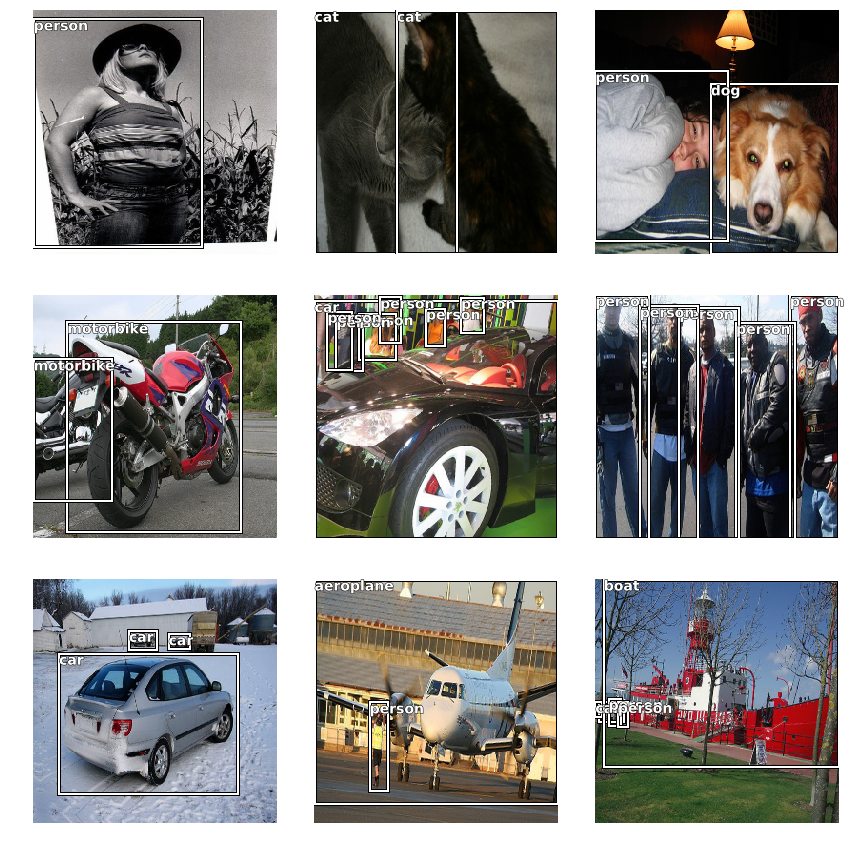

In [61]:
data.show_batch(rows=3)

# Модель

![alt text](https://forums.fast.ai/uploads/default/original/2X/a/aaef5a749262ce877ccd946fa84fecc590f4334b.jpg)

Допустим, мы хотим разделить картинку на 16 частей и в каждой попытаться найти объект. Логичный способ - взять выход сверточной нейросети (у resnet он будет размером 7x7x512), и либо сделать линейный слой с выходом (число классов + 4 координаты)х16, либо сделать еще свертку, которая даст такой же выход. Выберем второй вариант

In [0]:
def create_anchors(anc_grids, anc_zooms, anc_ratios):
    '''
    anc_grids - какие размеры сеток используем
    anc_zooms - коэффициенты для базового размера
    anc_ratios - соотношения сторон
    '''
    grids = anc_grids
    zooms = anc_zooms
    ratios =  anc_ratios

    anchor_scales = [(anz*i, anz*j) for anz in anc_zooms for (i,j) in anc_ratios]
    anchors_per_cell = len(anchor_scales)
    anc_offsets = [1/(o*2) for o in anc_grids]
    anc_x = np.concatenate([np.repeat(np.linspace(ao, 1-ao, ag), ag)
                            for ao,ag in zip(anc_offsets,anc_grids)])
    anc_y = np.concatenate([np.tile(np.linspace(ao, 1-ao, ag), ag)
                            for ao,ag in zip(anc_offsets,anc_grids)])
    anc_ctrs = np.repeat(np.stack([anc_x,anc_y], axis=1), anchors_per_cell, axis=0)
    anc_sizes  =   np.concatenate([np.array([[o/ag,p/ag] for i in range(ag*ag) for o,p in anchor_scales])
                   for ag in anc_grids])
    grid_sizes = torch.Tensor(np.concatenate([np.array([ 1/ag  for i in range(ag*ag) for o,p in anchor_scales])
                   for ag in anc_grids])).unsqueeze(1)
    anchors = torch.Tensor(np.concatenate([anc_ctrs, anc_sizes], axis=1)).float()
    
    return anchors


def hw2corners(ctr, hw): 
    return torch.cat([ctr-hw/2, ctr+hw/2], dim=1)

In [0]:
anchors = create_anchors([4],[1],[[1,1]]).cuda()
anchor_cnr = hw2corners(anchors[:,:2], anchors[:,2:])

In [0]:
def draw_outline(o, lw):
    o.set_path_effects([patheffects.Stroke(
        linewidth=lw, foreground='black'), patheffects.Normal()])

def draw_rect(ax, b, color='white'):
    patch = ax.add_patch(patches.Rectangle(b[:2], *b[-2:], fill=False, edgecolor=color, lw=2))
    draw_outline(patch, 4)

def draw_text(ax, xy, txt, sz=14, color='white'):
    text = ax.text(*xy, txt,
        verticalalignment='top', color=color, fontsize=sz, weight='bold')
    draw_outline(text, 1)

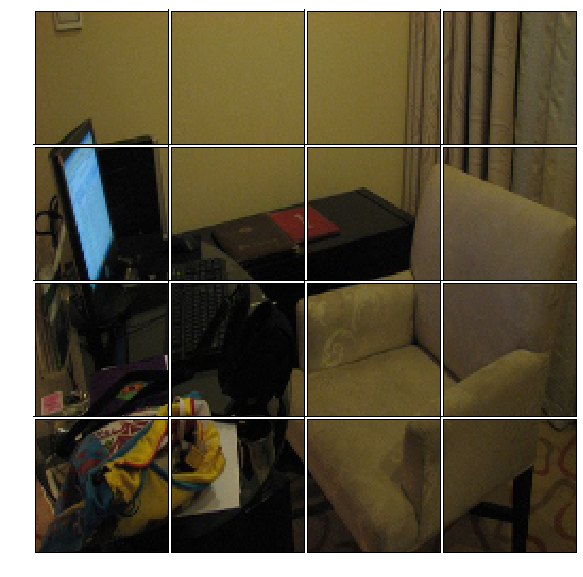

In [68]:
n=21
fig,ax = plt.subplots(figsize=(10,10))
data.valid_ds[n][0].show(ax=ax)
for i, bbox in enumerate(anchors.cpu()[:16]):
    bb = bbox.numpy()
    x = (bb[0]-bb[2]/2) * size 
    y = (bb[1]-bb[3]/2) * size 
    w = bb[2] * size
    h = bb[3] * size
    
    rect = [x,y,w,h]
    draw_rect(ax,rect)

In [0]:
class ConvLayer(nn.Module):
    def __init__(self, nin, nout, stride=2, drop=0.1):
        super().__init__()
        self.conv = nn.Conv2d(nin, nout, 3, stride=stride, padding=1)
        self.bn = nn.BatchNorm2d(nout)
        self.dropout = nn.Dropout(drop)
        
    def forward(self, x): 
        return self.dropout(self.bn(F.relu(self.conv(x))))

In [0]:
def flatten_conv(x, k):
    bs,nf,gx,gy = x.size()
    x = x.permute(0,2,3,1).contiguous()
    return x.view(bs,-1,nf//k)

class OutputConvLayer(nn.Module):
    def __init__(self, k, nin, bias):
        super().__init__()
        self.k = k
        self.oconv1 = nn.Conv2d(nin, (num_classes)*k, 3, padding=1)
        self.oconv2 = nn.Conv2d(nin, 4*k, 3, padding=1)
        self.oconv1.bias.data.zero_().add_(bias)
        
    def forward(self, x):
        return [flatten_conv(self.oconv1(x), self.k),
                flatten_conv(self.oconv2(x), self.k)]

In [0]:
class SSD_Head(nn.Module):
    def __init__(self, k, bias):
        super().__init__()
        self.dropout = nn.Dropout(0.25)
        self.conv0 = ConvLayer(512,256, stride=1)
#         self.sconv1 = StdConv(256,256)
        self.conv2 = ConvLayer(256,256, stride=2)
        self.outconv = OutputConvLayer(k, 256, bias)
        
    def forward(self, x):
        x = self.dropout(F.relu(x))
        x = self.conv0(x)
#         x = self.sconv1(x)
        x = self.conv2(x)
        return self.outconv(x)
    
class SSD_Net(nn.Module):
    def __init__(self, arch=models.resnet34):
        super().__init__() 
        self.encoder = create_body(arch)
        self.head = SSD_Head(1, -3)
        
    def forward(self, im):
        x = self.encoder(im)
        x = self.head(x)
        return x

Как задать функцию ошибок?

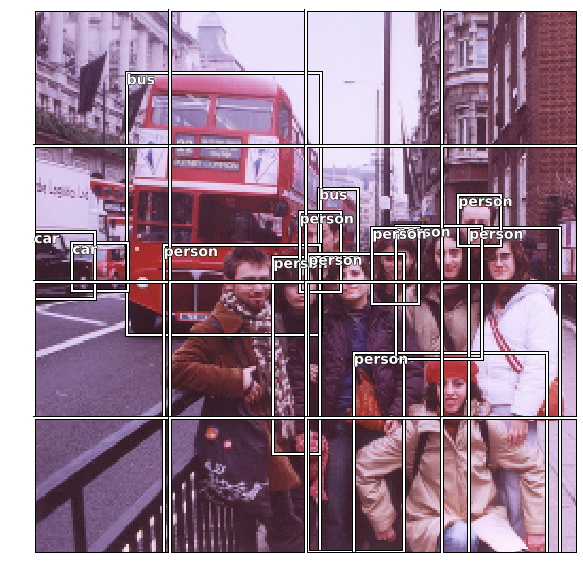

In [91]:
n=22
fig,ax = plt.subplots(figsize=(10,10))
data.valid_ds[n][0].show(y=data.valid_ds[n][1], ax=ax)
for i, bbox in enumerate(anchors.cpu()):
    bb = bbox.numpy()
    x = (bb[0]-bb[2]/2) * size 
    y = (bb[1]-bb[3]/2) * size 
    w = bb[2] * size
    h = bb[3] * size
    
    rect = [x,y,w,h]
    draw_rect(ax,rect)

![alt text](https://www.pyimagesearch.com/wp-content/uploads/2016/09/iou_equation.png)

In [0]:
def get_y(bbox, classes):
    bbox = bbox.view(-1,4) #/sz
    bb_keep = ((bbox[:,2]-bbox[:,0])>0).nonzero()[:,0]
    return bbox[bb_keep],classes[bb_keep]

def box_sz(b): return ((b[:, 2]-b[:, 0]) * (b[:, 3]-b[:, 1]))
  
def intersect(box_a, box_b):
    max_xy = torch.min(box_a[:, None, 2:], box_b[None, :, 2:])
    min_xy = torch.max(box_a[:, None, :2], box_b[None, :, :2])
    inter = torch.clamp((max_xy - min_xy), min=0)
    return inter[:, :, 0] * inter[:, :, 1]
  
def jaccard(box_a, box_b):
    inter = intersect(box_a, box_b)
    union = box_sz(box_a).unsqueeze(1) + box_sz(box_b).unsqueeze(0) - inter
    return inter / union

возьмем классы и координаты рамок для одной картинки

In [0]:
y = data.valid_ds[n][1].data

In [94]:
bbox, clas = get_y(y[0].cuda(), torch.tensor(y[1]).cuda())
bbox, clas

(tensor([[-0.3440,  0.0480, -0.0960,  0.1920],
         [-0.7680, -0.6600,  0.1960,  0.0560],
         [-0.1440, -0.8600,  0.0320, -0.6560],
         [-0.1840, -1.0000,  0.0640, -0.7760],
         [-0.1360, -0.5240,  1.0000,  0.0520],
         [-0.0920, -0.1200,  0.6320,  0.0520],
         [-0.2560, -0.0240,  0.0360,  0.1280],
         [-0.1040,  0.0080,  0.9920,  0.3600],
         [ 0.2600,  0.1760,  1.0000,  0.8880],
         [-0.2000,  0.6000,  1.0000,  0.9360],
         [-0.3200,  0.5600, -0.1320,  0.7160],
         [-0.2080,  0.3320,  0.2840,  0.6480],
         [-0.2000,  0.2440,  0.0800,  0.4160]], device='cuda:0'),
 tensor([ 6,  6,  7,  7, 15, 15, 15, 15, 15, 15, 15, 15, 15], device='cuda:0'))

Посчитаем пересечения с якорями

In [95]:
overlaps = jaccard(bbox.data.cuda(), anchor_cnr.data*2-1)
overlaps

tensor([[0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.1428, 0.0000, 0.0000,
         0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.0478, 0.1662, 0.0162, 0.0000, 0.0930, 0.3622, 0.0307, 0.0000, 0.0345,
         0.1164, 0.0118, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.0000, 0.0000, 0.1145, 0.0000, 0.0000, 0.0000, 0.0234,
         0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.0000, 0.0000, 0.1559, 0.0000, 0.0000, 0.0000, 0.0492,
         0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.0000, 0.0000, 0.0036, 0.0813, 0.0079, 0.0000, 0.0134,
         0.3821, 0.0296, 0.0000, 0.0134, 0.3821, 0.0296, 0.0000],
        [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0304, 0.0129, 0.0000, 0.0000,
         0.1908, 0.0746, 0.0000, 0.0000, 0.0442, 0.0187, 0.0000],
        [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0213, 0.1253, 0.0000, 0.0000,
         0.0029, 0.0159, 0.0000, 0.00

In [96]:
overlaps.shape

torch.Size([13, 16])

In [97]:
overlaps.max(0)

(tensor([0.0478, 0.1662, 0.0162, 0.0000, 0.1559, 0.3622, 0.1428, 0.1173, 0.0492,
         0.3821, 0.3828, 0.3462, 0.0134, 0.3821, 0.3744, 0.3462],
        device='cuda:0'),
 tensor([ 1,  1,  1,  0,  3,  1,  0, 10,  3,  4,  7,  9,  4,  4,  7,  9],
        device='cuda:0'))

In [98]:
overlaps.max(1)

(tensor([0.1428, 0.3622, 0.1145, 0.1559, 0.3821, 0.1908, 0.1253, 0.3828, 0.3328,
         0.3462, 0.1173, 0.1334, 0.1304], device='cuda:0'),
 tensor([ 6,  5,  4,  4,  9,  9,  6, 10, 15, 11,  7, 10,  6], device='cuda:0'))

Теперь сопоставим значения IoU с классами следующим образом: если в якоре для данного объекта значение максимально, то якорь относим к этому объекту. В ином случае, если значение IoU > 0.5 для какого-нибудь объекта, тоже относим к объекту, а если меньше, то считаем, что там фон.

In [0]:
def map_to_ground_truth(overlaps, print_it=False):
    prior_overlap, prior_idx = overlaps.max(1)
    if print_it: print(prior_overlap)
    gt_overlap, gt_idx = overlaps.max(0)
    gt_overlap[prior_idx] = 1.99
    for i,o in enumerate(prior_idx): gt_idx[o] = i
    return gt_overlap, gt_idx

In [100]:
gt_overlap, gt_idx = map_to_ground_truth(overlaps)
gt_overlap, gt_idx

(tensor([0.0478, 0.1662, 0.0162, 0.0000, 1.9900, 1.9900, 1.9900, 1.9900, 0.0492,
         1.9900, 1.9900, 1.9900, 0.0134, 0.3821, 0.3744, 1.9900],
        device='cuda:0'),
 tensor([ 1,  1,  1,  0,  3,  1, 12, 10,  3,  5, 11,  9,  4,  4,  7,  8],
        device='cuda:0'))

In [101]:
gt_clas = clas[gt_idx]; gt_clas

tensor([ 6,  6,  6,  6,  7,  6, 15, 15,  7, 15, 15, 15, 15, 15, 15, 15],
       device='cuda:0')

In [102]:
thresh = 0.5
pos = gt_overlap > thresh
pos_idx = torch.nonzero(pos)[:,0]
neg_idx = torch.nonzero(1-pos)[:,0]
pos_idx

tensor([ 4,  5,  6,  7,  9, 10, 11, 15], device='cuda:0')

In [103]:
pos = gt_overlap > thresh
pos

tensor([0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1], device='cuda:0',
       dtype=torch.uint8)

In [0]:
id2cat = data.y.classes

In [105]:
gt_clas[pos==0] = 0
[id2cat[o] if o<len(id2cat)+1 else 'background' for o in gt_clas.data]

['background',
 'background',
 'background',
 'background',
 'car',
 'bus',
 'person',
 'person',
 'background',
 'person',
 'person',
 'person',
 'background',
 'background',
 'background',
 'person']

In [0]:
def one_hot_embedding(labels, num_classes):
    return torch.eye(num_classes)[labels.data]

class BCE_Loss(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.num_classes = num_classes

    def forward(self, pred, targ):
        t = one_hot_embedding(targ, self.num_classes)
        t = torch.Tensor(t[:,1:].contiguous()).cuda()
        x = pred[:,1:]
        w = self.get_weight(x,t)
        return F.binary_cross_entropy_with_logits(x, t, w, size_average=False)/(self.num_classes-1)
    
    def get_weight(self,x,t): return None

loss_f = BCE_Loss(data.c)

def actn_to_bb(actn, anchors, grid_sizes):
    actn_bbs = torch.tanh(actn)
    actn_centers = (actn_bbs[:,:2]/2 * grid_sizes) + anchors[:,:2]
    actn_hw = (actn_bbs[:,2:]/2+1) * anchors[:,2:]
    return hw2corners(actn_centers, actn_hw)

def map_to_ground_truth(overlaps, print_it=False):
    prior_overlap, prior_idx = overlaps.max(1)
    if print_it: print(prior_overlap)
    gt_overlap, gt_idx = overlaps.max(0)
    gt_overlap[prior_idx] = 1.99
    for i,o in enumerate(prior_idx): gt_idx[o] = i
    return gt_overlap, gt_idx
  

def ssd_1_loss(b_c, b_bb, bbox, clas, print_it=False):
    bbox,clas = get_y(bbox,clas)
    bbox = normalize_bbox(bbox)
    a_ic = actn_to_bb(b_bb, anchors, grid_sizes)
    overlaps = jaccard(bbox.data.cuda(), anchor_cnr.data)
    try:
        gt_overlap,gt_idx = map_to_ground_truth(overlaps, print_it)
    except Exception as e:
        return 0.,0.
    gt_clas = clas[gt_idx]
    pos = gt_overlap > 0.4
    pos_idx = torch.nonzero(pos)[:,0]
    gt_clas[pos==0] = 0
    gt_bbox = bbox[gt_idx]
    loc_loss = ((a_ic[pos_idx] - gt_bbox[pos_idx]).abs()).mean() #l1 loss
    clas_loss  = loss_f(b_c, gt_clas)
    return loc_loss, clas_loss

def ssd_loss(pred, targ1, targ2, print_it=False):
    lcs,lls = 0.,0.
    for b_c,b_bb,bbox,clas in zip(*pred, targ1, targ2):
        loc_loss,clas_loss = ssd_1_loss(b_c,b_bb,bbox.cuda(),clas.cuda(),print_it)
        lls += loc_loss; #print(loc_loss)
        lcs += clas_loss; #print(clas_loss)
    if print_it: print(f'loc: {lls}, clas: {lcs}')
    return lls+lcs

def box_sz(b): 
    return ((b[:, 2]-b[:, 0]) * (b[:, 3]-b[:, 1]))

def normalize_bbox(bbox): 
    return (bbox+1.)/2.

In [0]:
model = SSD_Net().cuda()

In [0]:
learn = Learner(data, model, loss_func = ssd_loss)

In [0]:
anc_grid = 4

In [0]:
grid_sizes = torch.tensor(np.array([1/anc_grid]), requires_grad=False).unsqueeze(1).float().cuda()

In [117]:
learn.lr_find()

/usr/local/lib/python3.6/dist-packages/torch/nn/_reduction.py:49: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


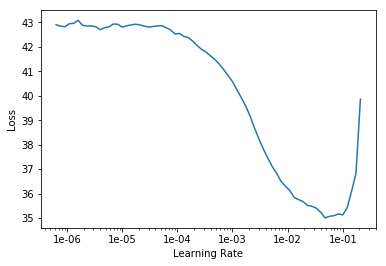

In [118]:
learn.recorder.plot()

In [129]:
learn.fit_one_cycle(2, 1e-3)

epoch,train_loss,valid_loss,time
0,19.528395,22.730942,01:05
1,18.158173,16.685858,01:06


/usr/local/lib/python3.6/dist-packages/torch/nn/_reduction.py:49: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


In [0]:
def show_ground_truth(ax, im, bbox, clas=None, prs=None, thresh=0.3):
    bb = [bb_hw(o) for o in bbox.reshape(-1,4)]
    if prs is None:  prs  = [None]*len(bb)
    if clas is None: clas = [None]*len(bb)
    ax = show_img(im.data.permute(1,2,0).numpy(), ax=ax)
    for i,(b,c,pr) in enumerate(zip(bb, clas, prs)):
        if((b[2]>0) and (pr is None or pr > thresh)):
            draw_rect(ax, b, color=colr_list[i%num_colr])
            txt = f'{i}: '
            if c is not None: txt += (id2cat[c])
            if pr is not None: txt += f' {pr:.2f}'
            draw_text(ax, b[:2], txt, color=colr_list[i%num_colr])
            
def torch_gt(ax, ima, bbox, clas, prs=None, thresh=0.1):
    return show_ground_truth(ax, ima, to_np((bbox*size).long()),
         to_np(clas), to_np(prs) if prs is not None else None, thresh)
  
def show_img(im, figsize=None, ax=None):
    if not ax: fig,ax = plt.subplots(figsize=figsize)
    ax.imshow(im)
    ax.set_xticks(np.linspace(0, size, 8))
    ax.set_yticks(np.linspace(0, size, 8))
    ax.grid()
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    return ax
  
def bb_hw(a): return np.array([a[1],a[0],a[3]-a[1]+1,a[2]-a[0]+1])

import matplotlib.cm as cmx
import matplotlib.colors as mcolors
from cycler import cycler

def get_cmap(N):
    color_norm  = mcolors.Normalize(vmin=0, vmax=N-1)
    return cmx.ScalarMappable(norm=color_norm, cmap='Set3').to_rgba

num_colr = 12
cmap = get_cmap(num_colr)
colr_list = [cmap(float(x)) for x in range(num_colr)]

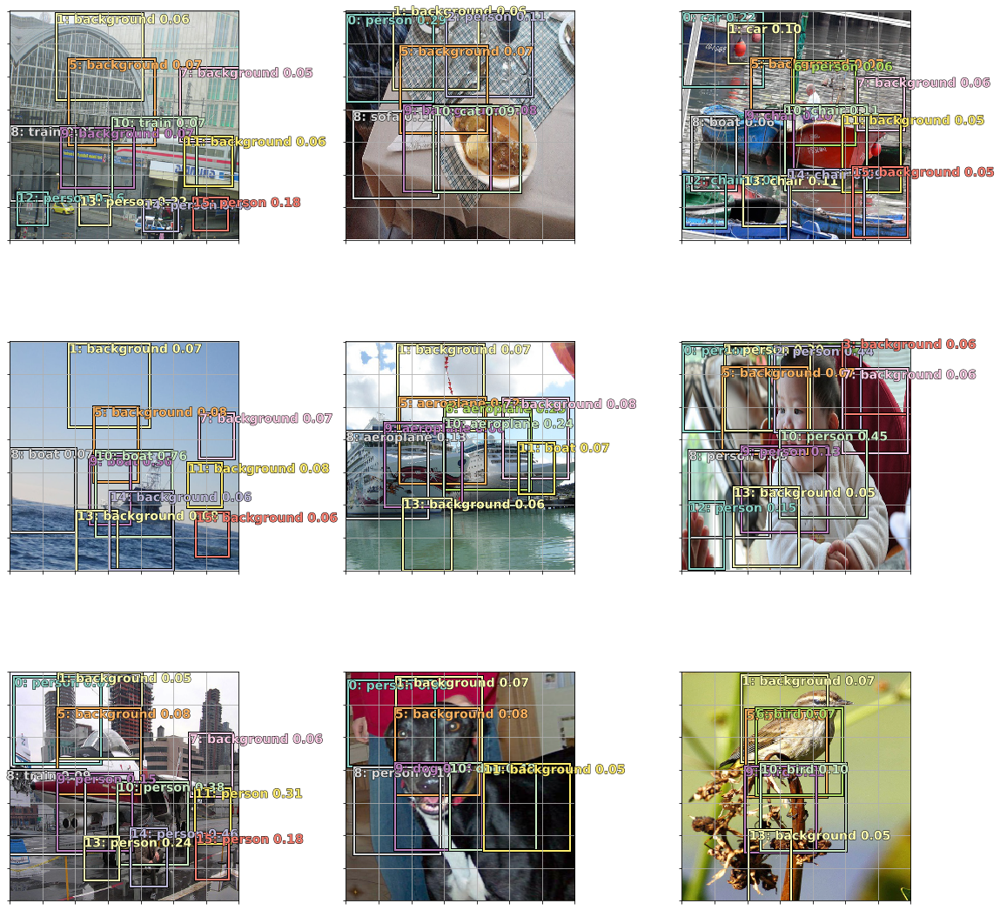

In [145]:
x, y = next(iter(data.train_dl))
batch = learn.model(x)
b_clas, b_bb = batch
x = to_np(x)

fig, axes = plt.subplots(3, 3, figsize=(16, 16))
for idx,ax in enumerate(axes.flat):
    ima=Image(torch.tensor(x[idx,:,:,:]))
    bbox,clas = get_y(y[0][idx], y[1][idx])
    a_ic = actn_to_bb(b_bb[idx], anchors, grid_sizes)
    torch_gt(ax, ima, a_ic, b_clas[idx].max(1)[1], b_clas[idx].max(1)[0].sigmoid(), 0.05)
plt.tight_layout()

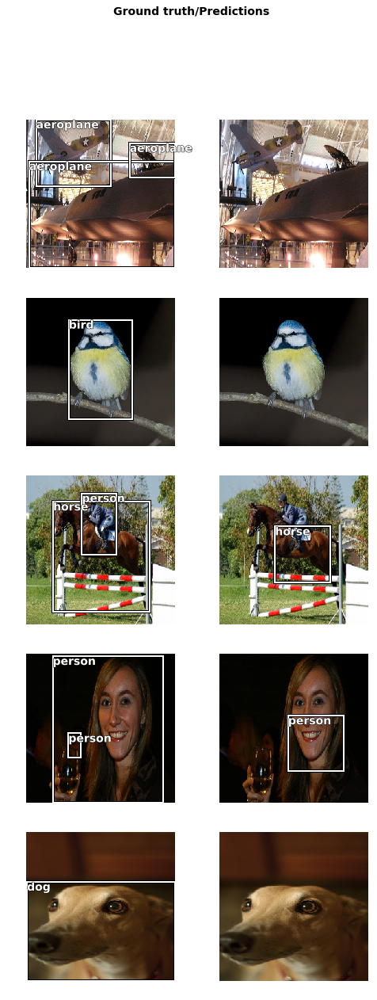

In [130]:
learn.show_results()

# Больше якорей

In [146]:
anc_grids = [4,2,1]
# anc_grids = [2]
anc_zooms = [0.7, 1., 1.3]
# anc_zooms = [1.]
anc_ratios = [(1.,1.), (1.,0.5), (0.5,1.)]
# anc_ratios = [(1.,1.)]
anchor_scales = [(anz*i,anz*j) for anz in anc_zooms for (i,j) in anc_ratios]
k = len(anchor_scales)
anc_offsets = [1/(o*2) for o in anc_grids]
k

9

In [0]:
anc_x = np.concatenate([np.repeat(np.linspace(ao, 1-ao, ag), ag)
                        for ao,ag in zip(anc_offsets,anc_grids)])
anc_y = np.concatenate([np.tile(np.linspace(ao, 1-ao, ag), ag)
                        for ao,ag in zip(anc_offsets,anc_grids)])
anc_ctrs = np.repeat(np.stack([anc_x,anc_y], axis=1), k, axis=0)

In [0]:
anc_sizes  =   np.concatenate([np.array([[o/ag,p/ag] for i in range(ag*ag) for o,p in anchor_scales])
               for ag in anc_grids])
grid_sizes = torch.tensor(np.concatenate([np.array([ 1/ag       for i in range(ag*ag) for o,p in anchor_scales])
               for ag in anc_grids]), requires_grad=False).unsqueeze(1).float().cuda()
anchors = torch.tensor(np.concatenate([anc_ctrs, anc_sizes], axis=1), requires_grad=False).float().cuda()
anchor_cnr = hw2corners(anchors[:,:2], anchors[:,2:])

In [0]:
drop=0.4

class SSD_MultiHead(nn.Module):
    def __init__(self, k, bias):
        super().__init__()
        self.drop = nn.Dropout(drop)
        self.sconv0 = ConvLayer(512,256, stride=1, drop=drop)
        self.sconv1 = ConvLayer(256,256, drop=drop)
        self.sconv2 = ConvLayer(256,256, drop=drop)
        self.sconv3 = ConvLayer(256,256, drop=drop)
        self.out0 = OutputConvLayer(k, 256, bias)
        self.out1 = OutputConvLayer(k, 256, bias)
        self.out2 = OutputConvLayer(k, 256, bias)
        self.out3 = OutputConvLayer(k, 256, bias)

    def forward(self, x):
        x = self.drop(F.relu(x))
        x = self.sconv0(x)
        x = self.sconv1(x)
        o1c,o1l = self.out1(x)
        x = self.sconv2(x)
        o2c,o2l = self.out2(x)
        x = self.sconv3(x)
        o3c,o3l = self.out3(x)
        return [torch.cat([o1c,o2c,o3c], dim=1),
                torch.cat([o1l,o2l,o3l], dim=1)]


class SSD_Net_Multi(nn.Module):
    def __init__(self, arch=models.resnet34):
        super().__init__()
        self.encoder = create_body(arch)
        self.head = SSD_MultiHead(k, -4.)
        
    def forward(self, im):
        x = self.encoder(im)
        x = self.head(x)
        return x

In [0]:
model = SSD_Net_Multi().cuda()

In [0]:
learn = Learner(data, model, loss_func = ssd_loss)

In [153]:
learn.lr_find()

/usr/local/lib/python3.6/dist-packages/torch/nn/_reduction.py:49: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


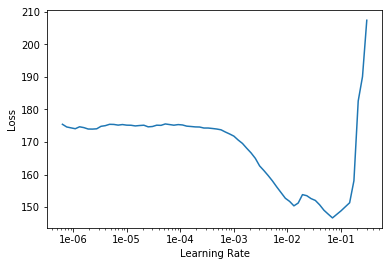

In [154]:
learn.recorder.plot()

In [155]:
learn.fit_one_cycle(2, slice(3e-3))

epoch,train_loss,valid_loss,time
0,96.185890,80.129524,01:05
1,80.945541,71.924217,01:06


/usr/local/lib/python3.6/dist-packages/torch/nn/_reduction.py:49: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


In [0]:
learn.unfreeze()

In [160]:
learn.lr_find()

/usr/local/lib/python3.6/dist-packages/torch/nn/_reduction.py:49: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


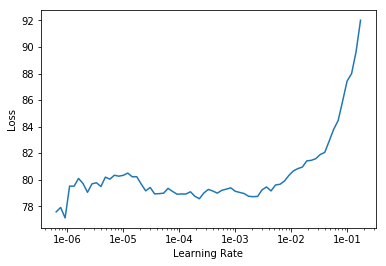

In [161]:
learn.recorder.plot()

In [0]:
learn.fit_one_cycle(10, slice(1e-3))

epoch,train_loss,valid_loss,time


/usr/local/lib/python3.6/dist-packages/torch/nn/_reduction.py:49: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


In [0]:
learn.show_results(rows=30)

In [0]:
x, y = next(iter(data.train_dl))
batch = learn.model(x)
b_clas, b_bb = batch
x = to_np(x)

fig, axes = plt.subplots(3, 3, figsize=(16, 16))
for idx,ax in enumerate(axes.flat):
    ima=Image(torch.tensor(x[idx,:,:,:]))
    bbox,clas = get_y(y[0][idx], y[1][idx])
    a_ic = actn_to_bb(b_bb[idx], anchors, grid_sizes)
    torch_gt(ax, ima, a_ic, b_clas[idx].max(1)[1], b_clas[idx].max(1)[0].sigmoid(), 0.05)
plt.tight_layout()

In [225]:
data.valid_ds[0][1].data

(tensor([[-1.0000, -0.8720, -0.1078,  0.1320],
         [-0.4371, -0.9640,  1.0000,  1.0000],
         [-0.6826,  0.3880, -0.2216,  1.0000]]), array([1, 1, 1]))

# Focal loss

![alt text](https://forums.fast.ai/uploads/default/optimized/2X/9/9c10eab94378aa49fd44ba0afc801efff4e2c00c_2_690x424.jpg)

In [0]:
class FocalLoss(BCE_Loss):
    def get_weight(x,t):
        alpha,gamma = 0.25,1
        p = x.sigmoid()
        pt = p*t + (1-p)*(1-t)
        w = alpha*t + (1-alpha)*(1-t)
        w = w * (1-pt).pow(gamma)
        return w.detach()

# Всё вместе

In [0]:
from fastai.vision.data import ObjectCategoryList, ObjectItemList, imagenet_stats
from fastai.vision.image import ImageBBox
import torch


def nms(boxes, scores, overlap=0.5, top_k=100):
    keep = scores.new(scores.size(0)).zero_().long()
    if boxes.numel() == 0: return keep
    x1 = boxes[:, 0]
    y1 = boxes[:, 1]
    x2 = boxes[:, 2]
    y2 = boxes[:, 3]
    area = torch.mul(x2 - x1, y2 - y1)
    v, idx = scores.sort(0)  # sort in ascending order
    idx = idx[-top_k:]  # indices of the top-k largest vals
    xx1 = boxes.new()
    yy1 = boxes.new()
    xx2 = boxes.new()
    yy2 = boxes.new()
    w = boxes.new()
    h = boxes.new()

    count = 0
    while idx.numel() > 0:
        i = idx[-1]  # index of current largest val
        keep[count] = i
        count += 1
        if idx.size(0) == 1: break
        idx = idx[:-1]  # remove kept element from view
        # load bboxes of next highest vals
        torch.index_select(x1, 0, idx, out=xx1)
        torch.index_select(y1, 0, idx, out=yy1)
        torch.index_select(x2, 0, idx, out=xx2)
        torch.index_select(y2, 0, idx, out=yy2)
        # store element-wise max with next highest score
        xx1 = torch.clamp(xx1, min=x1[i])
        yy1 = torch.clamp(yy1, min=y1[i])
        xx2 = torch.clamp(xx2, max=x2[i])
        yy2 = torch.clamp(yy2, max=y2[i])
        w.resize_as_(xx2)
        h.resize_as_(yy2)
        w = xx2 - xx1
        h = yy2 - yy1
        # check sizes of xx1 and xx2.. after each iteration
        w = torch.clamp(w, min=0.0)
        h = torch.clamp(h, min=0.0)
        inter = w*h
        # IoU = i / (area(a) + area(b) - i)
        rem_areas = torch.index_select(area, 0, idx)  # load remaining areas)
        union = (rem_areas - inter) + area[i]
        IoU = inter/union  # store result in iou
        # keep only elements with an IoU <= overlap
        idx = idx[IoU.le(overlap)]
    return keep, count


class SSDObjectCategoryList(ObjectCategoryList):
    "`ItemList` for labelled bounding boxes detected using SSD."
    def analyze_pred(self, pred, thresh=0.5, nms_overlap=0.1, ssd=None):
        # def analyze_pred(pred, anchors, grid_sizes, thresh=0.5, nms_overlap=0.1, ssd=None):
        b_clas, b_bb = pred
        a_ic = ssd._actn_to_bb(b_bb, ssd._anchors.cpu(), ssd._grid_sizes.cpu())
        conf_scores, clas_ids = b_clas[:, 1:].max(1)
        conf_scores = b_clas.t().sigmoid()

        out1, bbox_list, class_list = [], [], []

        for cl in range(1, len(conf_scores)):
            c_mask = conf_scores[cl] > thresh
            if c_mask.sum() == 0: 
                continue
            scores = conf_scores[cl][c_mask]
            l_mask = c_mask.unsqueeze(1)
            l_mask = l_mask.expand_as(a_ic)
            boxes = a_ic[l_mask].view(-1, 4) # boxes are now in range[ 0, 1]
            boxes = (boxes-0.5) * 2.0        # putting boxes in range[-1, 1]
            ids, count = nms(boxes.data, scores, nms_overlap, 50) # FIX- NMS overlap hardcoded
            ids = ids[:count]
            out1.append(scores[ids])
            bbox_list.append(boxes.data[ids])
            class_list.append(torch.tensor([cl]*count))

        if len(bbox_list) == 0:
            return None #torch.Tensor(size=(0,4)), torch.Tensor()

        return torch.cat(bbox_list, dim=0), torch.cat(class_list, dim=0) # torch.cat(out1, dim=0), 

    
    def reconstruct(self, t, x):
        if t is None: return None
        bboxes, labels = t
        if len((labels - self.pad_idx).nonzero()) == 0: return
        i = (labels - self.pad_idx).nonzero().min()
        bboxes,labels = bboxes[i:],labels[i:]
        return ImageBBox.create(*x.size, bboxes, labels=labels, classes=self.classes, scale=False)

    
class SSDObjectItemList(ObjectItemList):
    "`ItemList` suitable for object detection."
    _label_cls,_square_show_res = SSDObjectCategoryList,False

In [0]:
import torch
from torch import nn
import torch.nn.functional as F

def conv_params(in_size, out_size):
    filters = [3,2,5,4]
    strides = [1,2,3] # max_stride = 3
    pads = [0,1,2,3] # max pad
    
    if out_size == 1:
        return 1, 0, in_size
    
    for filter_size in filters:
        for pad in pads:
            for stride in strides:
                if ((out_size - 1) * stride == (in_size - filter_size) + 2 * pad):
                    return stride, pad, filter_size
    return None, None, None

class StdConv(nn.Module):
    def __init__(self, nin, nout, filter_size=3, stride=2, padding=1, drop=0.1):
        super().__init__()
        self.conv = nn.Conv2d(nin, nout, filter_size, stride=stride, padding=padding)
        self.bn = nn.BatchNorm2d(nout)
        self.drop = nn.Dropout(drop)
        
    def forward(self, x): 
        return self.drop(self.bn(F.relu(self.conv(x))))
        
def flatten_conv(x,k):
    bs,nf,gx,gy = x.size()
    x = x.permute(0,2,3,1).contiguous()
    return x.view(bs,-1,nf//k)

class OutConv(nn.Module):
    def __init__(self, k, nin, num_classes, bias):
        super().__init__()
        self.k = k
        self.oconv1 = nn.Conv2d(nin, (num_classes)*k, 3, padding=1)
        self.oconv2 = nn.Conv2d(nin, 4*k, 3, padding=1)
        self.oconv1.bias.data.zero_().add_(bias)
        
    def forward(self, x):
        return [flatten_conv(self.oconv1(x), self.k),
                flatten_conv(self.oconv2(x), self.k)]
    
class SSDHead(nn.Module):
    def __init__(self, grids, anchors_per_cell, num_classes, drop=0.3, bias=-4.):
        super().__init__()
        self.drop = nn.Dropout(drop)
        
        self.sconvs = nn.ModuleList([])
        self.oconvs = nn.ModuleList([])
        
        self.anc_grids = grids
        
        self._k = anchors_per_cell

        
        self.sconvs.append(StdConv(512, 256, stride=1, drop=drop))
        
        
        for i in range(len(grids)):
            
            if i == 0:
                stride, pad, filter_size = conv_params(7, grids[i]) # get '7' by base model
            else:
                stride, pad, filter_size = conv_params(grids[i-1], grids[i])
            
            if stride is None:
                print(grids[i-1], ' --> ', grids[i])
                raise Exception('cannot create model for specified grids')
                
            self.sconvs.append(StdConv(256, 256, filter_size, stride=stride, padding=pad, drop=drop))
            self.oconvs.append(OutConv(self._k, 256, num_classes=num_classes, bias=bias))
                
    def forward(self, x):
        x = self.drop(F.relu(x))
        x = self.sconvs[0](x)
        out_classes = []
        out_bboxes = []
        for sconv, oconv in zip(self.sconvs[1:], self.oconvs):
            x = sconv(x)
            out_class, out_bbox = oconv(x)
            out_classes.append(out_class)
            out_bboxes.append(out_bbox)
            
        return [torch.cat(out_classes, dim=1),
                torch.cat(out_bboxes, dim=1)]

def one_hot_embedding(labels, num_classes):
    return torch.eye(num_classes)[labels.data.cpu()]

class BCE_Loss(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.num_classes = num_classes

    def forward(self, pred, targ):
        t = one_hot_embedding(targ, self.num_classes)
        t = torch.Tensor(t[:,1:].contiguous()).cuda()
        x = pred[:,1:]
        w = self.get_weight(x,t)
        return F.binary_cross_entropy_with_logits(x, t, w, size_average=False)/(self.num_classes-1)
    
    def get_weight(self,x,t): return None

class FocalLoss(BCE_Loss):
    def get_weight(self,x,t):
        alpha,gamma = 0.25,1
        p = x.sigmoid()
        pt = p*t + (1-p)*(1-t)
        w = alpha*t + (1-alpha)*(1-t)
        w = w * (1-pt).pow(gamma)
        return w.detach()

In [0]:
import torch
from fastai.vision.learner import create_cnn
from torchvision.models import resnet34
import numpy as np
import json
import os
from pathlib import Path

class _EmptyData():
    def __init__(self, path, c, loss_func: None):
        self.path = path
        self.device = torch.device('cuda') if torch.cuda.is_available else torch.device('cpu')
        self.c = c
        self.loss_func = loss_func

class SingleShotDetector(object):
    
    def __init__(self, data, grids=[4, 2, 1], zooms=[0.7, 1., 1.3], ratios=[[1., 1.], [1., 0.5], [0.5, 1.]], 
                 backbone=None, drop=0.3, bias=-4., focal_loss=False, pretrained_path=None):
        
        super().__init__()

        self._device = torch.device('cuda') if torch.cuda.is_available else torch.device('cpu')


        if backbone is None:
            backbone = resnet34
            
        self._create_anchors(grids, zooms, ratios)
        
        ssd_head = SSDHead(grids, self._anchors_per_cell, data.c, drop=drop, bias=bias)

        self._data = data
        self.learn = create_cnn(data=data, base_arch=backbone, custom_head=ssd_head)
        self.learn.model = self.learn.model.to(self._device)

        if pretrained_path is not None:
            self.load(pretrained_path)
        
        if focal_loss:
            self._loss_f = FocalLoss(data.c)
        else:
            self._loss_f = BCE_Loss(data.c)
            
        self.learn.loss_func = self._ssd_loss

    @classmethod
    def from_emd(cls, data, emd_path):
        emd = json.load(open(emd_path))
        class_mapping = {i['Value'] : i['Name'] for i in emd['Classes']}
        if data is None:
            empty_data = _EmptyData(path='str', loss_func=None, c=len(class_mapping) + 1)
            return cls(empty_data, emd['Grids'], emd['Zooms'], emd['Ratios'], pretrained_path=emd['ModelFile'])
        else:
            return cls(data, emd['Grids'], emd['Zooms'], emd['Ratios'], pretrained_path=emd['ModelFile'])

    
    def lr_find(self):
        from IPython.display import clear_output
        self.learn.lr_find()
        clear_output()
        self.learn.recorder.plot()
        
    def fit(self, epochs=10, lr=slice(1e-4,3e-3)):
        self.learn.fit(epochs, lr)
        
    def fit_one_cycle(self, epochs=10, lr=slice(1e-4,3e-3)):
        self.learn.fit_one_cycle(epochs, lr)

    def unfreeze(self):
        self.learn.unfreeze()
        
    def _create_anchors(self, anc_grids, anc_zooms, anc_ratios):
        
        self.grids = anc_grids
        self.zooms = anc_zooms
        self.ratios =  anc_ratios

        anchor_scales = [(anz*i, anz*j) for anz in anc_zooms for (i,j) in anc_ratios]
        
        self._anchors_per_cell = len(anchor_scales)
        
        anc_offsets = [1/(o*2) for o in anc_grids]

        anc_x = np.concatenate([np.repeat(np.linspace(ao, 1-ao, ag), ag)
                                for ao,ag in zip(anc_offsets,anc_grids)])
        anc_y = np.concatenate([np.tile(np.linspace(ao, 1-ao, ag), ag)
                                for ao,ag in zip(anc_offsets,anc_grids)])
        anc_ctrs = np.repeat(np.stack([anc_x,anc_y], axis=1), self._anchors_per_cell, axis=0)

        anc_sizes  =   np.concatenate([np.array([[o/ag,p/ag] for i in range(ag*ag) for o,p in anchor_scales])
                       for ag in anc_grids])
        
        self._grid_sizes = torch.Tensor(np.concatenate([np.array([ 1/ag  for i in range(ag*ag) for o,p in anchor_scales])
                       for ag in anc_grids])).unsqueeze(1).to(self._device)
        
        self._anchors = torch.Tensor(np.concatenate([anc_ctrs, anc_sizes], axis=1)).float().to(self._device)
        
        self._anchor_cnr = self._hw2corners(self._anchors[:,:2], self._anchors[:,2:])
        
    def _hw2corners(self, ctr, hw): 
        return torch.cat([ctr-hw/2, ctr+hw/2], dim=1)

    def _get_y(self, bbox, clas):
        bbox = bbox.view(-1,4) #/sz
        bb_keep = ((bbox[:,2]-bbox[:,0])>0).nonzero()[:,0]
        return bbox[bb_keep],clas[bb_keep]

    def _actn_to_bb(self, actn, anchors, grid_sizes):
        actn_bbs = torch.tanh(actn)
        actn_centers = (actn_bbs[:,:2]/2 * grid_sizes) + anchors[:,:2]
        actn_hw = (actn_bbs[:,2:]/2+1) * anchors[:,2:]
        return self._hw2corners(actn_centers, actn_hw)

    def _map_to_ground_truth(self, overlaps, print_it=False):
        prior_overlap, prior_idx = overlaps.max(1)
        if print_it: print(prior_overlap)
        gt_overlap, gt_idx = overlaps.max(0)
        gt_overlap[prior_idx] = 1.99
        for i,o in enumerate(prior_idx): gt_idx[o] = i
        return gt_overlap, gt_idx
        
        
    def _ssd_1_loss(self, b_c, b_bb, bbox, clas, print_it=False):
        bbox,clas = self._get_y(bbox,clas)
        bbox = self._normalize_bbox(bbox)

        a_ic = self._actn_to_bb(b_bb, self._anchors, self._grid_sizes)
        overlaps = self._jaccard(bbox.data, self._anchor_cnr.data)
        try:
            gt_overlap,gt_idx = self._map_to_ground_truth(overlaps,print_it)
        except Exception as e:
            return 0.,0.
        gt_clas = clas[gt_idx]
        pos = gt_overlap > 0.4
        pos_idx = torch.nonzero(pos)[:,0]
        gt_clas[1-pos] = 0 #data.c - 1 # CHANGE
        gt_bbox = bbox[gt_idx]
        loc_loss = ((a_ic[pos_idx] - gt_bbox[pos_idx]).abs()).mean()
        clas_loss  = self._loss_f(b_c, gt_clas)
        return loc_loss, clas_loss
    
    def _ssd_loss(self, pred, targ1, targ2, print_it=False):
        lcs,lls = 0.,0.
        for b_c,b_bb,bbox,clas in zip(*pred, targ1, targ2):
            loc_loss,clas_loss = self._ssd_1_loss(b_c,b_bb,bbox.cuda(),clas.cuda(),print_it)
            lls += loc_loss; print(loc_loss)
            lcs += clas_loss; print(clas_loss)
        #if print_it: 
        print(f'loc: {lls}, clas: {lcs}') #CHANGE
        return lls+lcs
    
    def _intersect(self,box_a, box_b):
        max_xy = torch.min(box_a[:, None, 2:], box_b[None, :, 2:])
        min_xy = torch.max(box_a[:, None, :2], box_b[None, :, :2])
        inter = torch.clamp((max_xy - min_xy), min=0)
        return inter[:, :, 0] * inter[:, :, 1]

    def _box_sz(self, b): 
        return ((b[:, 2]-b[:, 0]) * (b[:, 3]-b[:, 1]))

    def _jaccard(self, box_a, box_b):
        inter = self._intersect(box_a, box_b)
        union = self._box_sz(box_a).unsqueeze(1) + self._box_sz(box_b).unsqueeze(0) - inter
        return inter / union
    
    def _normalize_bbox(self, bbox): 
        return (bbox+1.)/2.

    
    
    def save(self, name_or_path):
        if '\\' in name_or_path or '/' in name_or_path:
            path = Path(name_or_path)
            name = path.stem
            # to make fastai save to both path and with name
            temp = self.learn.path
            self.learn.path = path.parent
            self.learn.model_dir = ''
            if not os.path.exists(self.learn.path):
                os.makedirs(self.learn.path)            
            saved_path = self.learn.save(name, return_path=True)
            # undoing changes to self.learn.path and self.learn.model
            self.learn.path = temp
            self.learn.model_dir = 'models'
        else:
            temp = self.learn.path
            # fixing fastai bug
            self.learn.path = self.learn.path.parent
            if not os.path.exists(self.learn.path / self.learn.model_dir):
                os.makedirs(self.learn.path / self.learn.model_dir)            
            saved_path = self.learn.save(name_or_path,  return_path=True)
            # undoing changes to self.learn.path
            self.learn.path = temp

    def load(self, name_or_path):
        if '\\' in name_or_path or '/' in name_or_path:
            path = Path(name_or_path)
            name = path.stem
            # to make fastai from both path and with name
            temp = self.learn.path
            self.learn.path = path.parent
            self.learn.model_dir = ''
            self.learn.load(name)
            # undoing changes to self.learn.path and self.learn.model_dir
            self.learn.path = temp
            self.learn.model_dir = 'models'
        else:
            temp = self.learn.path
            # fixing fastai bug
            self.learn.path = self.learn.path.parent            
            self.learn.load(name_or_path)
            # undoing changes to self.learn.path
            self.learn.path = temp
        
    def show_results(self, rows=5, thresh=0.5, nms_overlap=0.1):
        self.learn.show_results(rows=rows, thresh=thresh, nms_overlap=nms_overlap, ssd=self)

In [115]:
ssd = SingleShotDetector(data,focal_loss=True)

/usr/local/lib/python3.6/dist-packages/fastai/vision/learner.py:105: UserWarning: `create_cnn` is deprecated and is now named `cnn_learner`.
  warn("`create_cnn` is deprecated and is now named `cnn_learner`.")


In [116]:
ssd.lr_find()

/usr/local/lib/python3.6/dist-packages/torch/nn/_reduction.py:49: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


tensor(0.0732, device='cuda:0', grad_fn=<MeanBackward1>)
tensor(67.5211, device='cuda:0', grad_fn=<DivBackward0>)
tensor(0.0903, device='cuda:0', grad_fn=<MeanBackward1>)
tensor(66.7132, device='cuda:0', grad_fn=<DivBackward0>)
tensor(0.1095, device='cuda:0', grad_fn=<MeanBackward1>)
tensor(67.0434, device='cuda:0', grad_fn=<DivBackward0>)
tensor(0.1723, device='cuda:0', grad_fn=<MeanBackward1>)
tensor(62.1935, device='cuda:0', grad_fn=<DivBackward0>)
tensor(0.1601, device='cuda:0', grad_fn=<MeanBackward1>)
tensor(60.5937, device='cuda:0', grad_fn=<DivBackward0>)
tensor(0.1815, device='cuda:0', grad_fn=<MeanBackward1>)
tensor(65.9863, device='cuda:0', grad_fn=<DivBackward0>)
tensor(0.1566, device='cuda:0', grad_fn=<MeanBackward1>)
tensor(66.0398, device='cuda:0', grad_fn=<DivBackward0>)
tensor(0.1117, device='cuda:0', grad_fn=<MeanBackward1>)
tensor(62.9915, device='cuda:0', grad_fn=<DivBackward0>)
tensor(0.1786, device='cuda:0', grad_fn=<MeanBackward1>)
tensor(65.4991, device='cuda:0'

KeyboardInterrupt: ignored

In [30]:
ssd.fit_one_cycle(5, lr=slice(1e-4, 1e-2))

epoch,train_loss,valid_loss,time
0,227.351654,18.174253,01:06
1,53.580822,15.435508,01:04
2,23.540165,14.324293,01:06
3,16.650162,13.268797,01:05
4,14.407372,12.867725,01:05


/usr/local/lib/python3.6/dist-packages/torch/nn/_reduction.py:49: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


In [0]:
ssd.unfreeze()

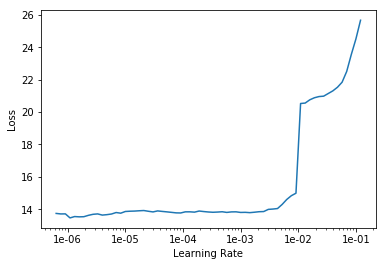

In [32]:
ssd.lr_find()

In [33]:
ssd.fit_one_cycle(5, lr=slice(1e-5, 1e-3))

epoch,train_loss,valid_loss,time
0,13.970222,12.653419,01:07
1,13.259525,11.776020,01:06
2,12.560129,11.134210,01:06
3,11.781391,10.639781,01:09
4,11.235125,10.585769,01:06


/usr/local/lib/python3.6/dist-packages/torch/nn/_reduction.py:49: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


In [34]:
ssd.fit_one_cycle(5, lr=slice(1e-5, 1e-3))

epoch,train_loss,valid_loss,time
0,11.209080,10.562683,01:06
1,11.377456,10.910319,01:06
2,10.927265,10.245438,01:07
3,10.272003,9.701263,01:06
4,9.923872,9.505039,01:07


/usr/local/lib/python3.6/dist-packages/torch/nn/_reduction.py:49: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


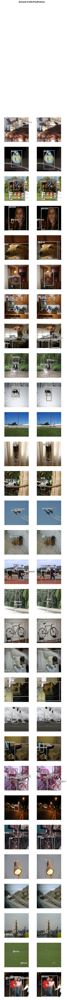

In [35]:
ssd.show_results(rows=30, thresh=0.2)

In [36]:
ssd.fit_one_cycle(15, lr=slice(1e-5, 1e-3))

epoch,train_loss,valid_loss,time
0,9.743262,9.497068,01:08
1,9.642803,9.415303,01:07
2,9.739921,9.666859,01:07
3,9.752647,9.669715,01:06
4,9.520856,9.461708,01:07
5,9.385540,9.470152,01:08
6,9.048454,9.153288,01:07
7,8.626112,8.802873,01:07
8,8.444744,8.687037,01:07
9,8.147245,8.529916,01:07


/usr/local/lib/python3.6/dist-packages/torch/nn/_reduction.py:49: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


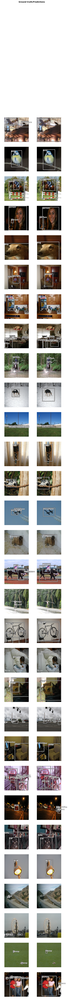

In [37]:
ssd.show_results(rows=30, thresh=0.2)